In [3]:
%load_ext autoreload
%autoreload 2
import numpy as np
import scipy

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import pandas as pd
import seaborn as sns
from pylab import cm
import json

import os
import sys
import re
import sympy

import cmath
import matplotlib.patches as patches
from matplotlib import colors as m2colors

import plotly
import plotly.graph_objects as go

from MMfxns import *
from MMdyn import *
from MMplotting import *
from pyDOE2 import lhs

cwd = os.getcwd()
sns.set(style="ticks", font_scale=1.5)

mcolors = dict(m2colors.BASE_COLORS, **m2colors.CSS4_COLORS)

saveall = False

import warnings
warnings.filterwarnings("ignore", category=np.VisibleDeprecationWarning) 

print(plotly.__version__)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
4.13.0


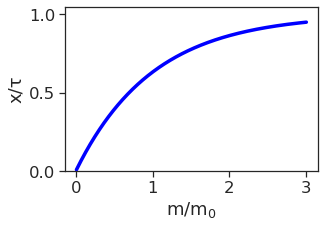

In [4]:
## figure 1

Nt = 500; x_space = np.linspace(0,3,Nt); m0 = 1.; m = np.linspace(0.01,3,Nt); 
fm = 1-np.exp(-m/m0)

fig, ax = plt.subplots(1,1, figsize=(5,3.5))
ax.plot(m/m0, fm, color = 'blue', linewidth=3.5, label='')
ax.set_xlabel('m/m$_{0}$'); ax.set_ylabel('x/\u03c4')

# soft
# fm = 1-np.exp(-m0/m)
# ax.plot(m/m0, fm, color = 'r', linewidth=2.5, label='soft activated')
# ax.set_xlabel('m/m$_{0}$') # ax[1].set_ylabel('x (gene expression)')
ax.plot([1., 1.], ax.get_ylim(), color = 'k', linestyle = '-.', linewidth=0.)
ax.set_ylim([0, ax.get_ylim()[1]])
# ax.legend(loc=4)

plt.tight_layout()

saveall = False
if saveall:
    direc = os.getcwd() + '/figures/figure1/'
#     direc = os.getcwd() + '/powerpoints/ppt_figs/'
    fname1 = direc + "stiff_only_activations_rect_v2.png"
    print(fname1)
    fig.savefig(fname1, format='png', dpi=600)


In [ ]:
## figure 2 phase diagram

In [ ]:
## figure 2 3D landscapes

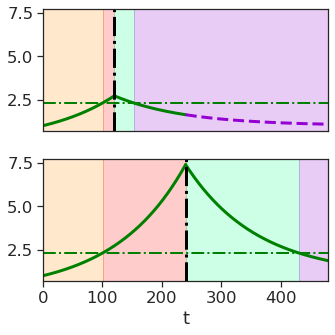

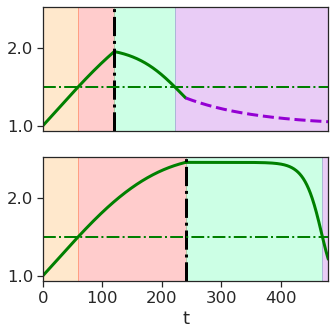

In [5]:
## figure 3 dynamics examples

params = {}
params['tau_SGR'] = 120 # params['tau_SG'] #* 2
params['TV0SR'] = 0.03
params['TV0SG'] = .5
params['a0'] = 1.
params['tau_SG'] = 120
params['tau_SR'] = 120
params['a_c'] = 2.3

res = 480

figdim = (5,5)

fig, fig2, ax, ax2 = plotwrap(params, res, figdim)

saveall = False
if saveall:
    
    ax[0].get_yaxis().set_ticks([])
    ax[1].get_yaxis().set_ticks([])
    ax2[0].get_yaxis().set_ticks([])
    ax2[1].get_yaxis().set_ticks([])
    
    direc = os.getcwd() + '/figures/figure3_timetraj/'
#     direc = os.getcwd() + '/powerpoints/ppt_figs/'

    fname1 = direc + "static_v3.png"
    print(fname1)
    fig.savefig(fname1, format='png', dpi=600)
    
    fname2 = direc + "dynamic_v3.png"
    print(fname2)
    fig2.savefig(fname2, format='png', dpi=600)

In [6]:
### figure 3 3D landscapes
params = {}
# stiff genes
res = 200
params = {}
params['kc'] = 1.
params['km'] = 'stiff'
params['n'] = 3
params['m0'] = 1.
params['x_c'] = x_crit(params['n'])

x_space = np.linspace(0, 3., res)
a_space = np.linspace(0.2, 3.5, res)
m_space = np.linspace(0., 3., res)

a_c = alpha_crit(m_space, params)

choose_m =0.6 # m_c
# have been using 0.4 and 0.6
params['a_c'] = a_c; params['m0'] = m0

m_c = scipy.optimize.fsolve(m_crit_general, 0.5, args=(params), xtol=1e-10)[0] / params['m0']
params['m_c'] = m_c
print(m_c)
choose_m_ind = np.where(np.abs(m_space - choose_m) == np.amin(np.abs(m_space-choose_m)))[0]
choose_ac = a_c[choose_m_ind]

# x_stiff = 1-np.exp(-choose_m/m0)
ac_ind = np.where(np.abs(a_space - choose_ac) == np.amin(np.abs(a_space - choose_ac)))[0]

U_data = np.zeros((len(x_space), len(a_space)))
U2_data = np.zeros((len(x_space), len(a_space)))

for ai, aa in enumerate(a_space):
    for xi, xx in enumerate(x_space):
        U_data[xi, ai] = U(f_m, choose_m, xx, aa, params)
#         U2_data[xi, ai] = U_old(f_m, choose_m, xx, aa, params)

gmin_coords = []
bi1_coords = []
bi2_coords = []
inf_coords = []
save_xlen = 0
for ai, aa in enumerate(a_space):
    xargs = find_peaks(-np.abs(np.diff(U_data[:,ai])))[0]
    x_mins = x_space[xargs]
    
#     if len(x_mins) != save_xlen:
#         plt.plot(x_space, U_data[:,ai], label=str(len(x_mins)))
    save_xlen = len(x_mins)    
#     print(x_mins)

    if len(x_mins) > 2:
        bi1_coords.append([np.amin(x_mins), aa, U_data[np.amin(xargs), ai]])
        bi2_coords.append([np.amax(x_mins), aa, U_data[np.amax(xargs), ai]])
    elif len(x_mins) > 1:
#         x_mins[U_data[x_mins, ai] == np.amin(U_data[x_mins, ai])]
        gmin_coords.append([x_mins[U_data[xargs, ai] == np.amin(U_data[xargs, ai])][0], aa, np.amin(U_data[xargs, ai])])
        inf_coords.append([x_mins[U_data[xargs, ai] == np.amax(U_data[xargs, ai])][0], aa, np.amax(U_data[xargs, ai])])
    else:
        gmin_coords.append([np.amin(x_mins), aa, U_data[np.amin(xargs), ai]])

gmin_coords = np.array(gmin_coords)
bi1_coords = np.array(bi1_coords)
bi2_coords = np.array(bi2_coords)
inf_coords = np.array(inf_coords)

# xplot = x_space[:np.sum(x_space < 1.75)]

# aplot = a_space[np.sum(a_space < 0.2):np.sum(a_space < 2.)]
# uplot = U_data[:np.sum(x_space < 1.75), np.sum(a_space < 0.2):np.sum(a_space < 2.)]

xplot = x_space
aplot = a_space
uplot = U_data # -U2_data

fig = go.Figure(data=[go.Surface(z=uplot.T, x=xplot, y=aplot, colorscale='blackbody',
                                cmin=np.amin(uplot)*0.8, cmax=np.amax(uplot)/6
                                )],
                     layout = go.Layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')
               )

fig.update_traces(contours_z=dict(show=True, usecolormap=False,
                                  project_z=True, start=np.amin(uplot) * 0.9, 
                                  end=np.amax(uplot), color='black', size=0.09))
if choose_m < params['m_c']:
    
    fig.add_scatter3d(x=bi1_coords[:,0], y=bi1_coords[:,1], z=bi1_coords[:,2]+0.01, mode='markers', showlegend=False,
                      marker=dict(size=4, color='blueviolet'), line=dict(color='blueviolet', width=10))

    fig.add_scatter3d(x=bi2_coords[:,0], y=bi2_coords[:,1], z=bi2_coords[:,2]+0.01, mode='markers', showlegend=False,
                      marker=dict(size=4, color='dodgerblue'), line=dict(color='dodgerblue', width=10))

fig.add_scatter3d(x=gmin_coords[:,0], y=gmin_coords[:,1], z=gmin_coords[:,2]+0.01, mode='markers', showlegend=False,
                  marker=dict(size=4, color='black'), line=dict(color='black', width=10))

# fig.add_scatter3d(x=inf_coords[:,0], y=inf_coords[:,1], z=inf_coords[:,2]+0.01, mode='markers', showlegend=False,
#                   marker=dict(size=4, color='red'), line=dict(color='red', width=10))

# print(U_data.T[:,ac_ind].shape)
# print(x_space.shape)
# print(np.ones(res)*a_c)

fig.add_scatter3d(x=x_space, y=np.ones(res)*choose_ac, z=U_data[:,ac_ind].squeeze()+0.01, #np.zeros(res),
                  mode='lines', showlegend=False, line=dict(color='red', width=8))

# ind_below = int(ac_ind - res/10)
# ind_above = int(ac_ind + res/10)

direc = os.getcwd() + '/figures/figure2/'
# # direc = os.getcwd() + '/powerpoints/ppt_figs/'
if choose_m > m_c:
    fname1 = direc + "XA_memory_eng_surface_overMC.png"
    titlename = 'Landscape m > m_c'
#     indg = ind_above
elif choose_m < m_c:
    fname1 = direc + "XA_memory_eng_surface_underMC.png"
    titlename = 'Landscape m < m_c'
#     indg = ind_below
elif choose_m == m_c:
#     fname1 = direc + "XA_memory_eng_surface_atMC.png"
    fname1 = direc + "plain_wadd.png"
    titlename = 'Landscape m = m_c'
#     indg = ind_below


fig.update_layout(title=titlename, autosize=True, scene=dict(
                    xaxis = dict(
                        title='<b>x</b>',
#                         title=' ',
                        titlefont=dict(family='Cambria', size=22), 
#                         autorange="reversed", 
#                         showticklabels=False,
                        range=[3., 0.],
                    ),
                    yaxis = dict(
                        title='<b>\u03b1</b>',
#                         title=' ',
                        titlefont=dict(family='Cambria', size=22),
#                         showticklabels=False,
                        range=[0.3, 3.],
                    ), 
                    zaxis = dict(
#                         title='U', 
                        title=' ',
                        range=[np.amin(uplot)*0.8, np.amax(uplot)/6],  
#                         showticklabels=False, titlefont=dict(family='Cambria', size=24)
                    ),
                    aspectmode='cube'),
                  width=1000, height=1000,
                  margin=dict(l=70, r=70, b=70, t=70),
                  font=dict(family='Cambria', size=16, color='#7f7f7f'),
                  
                  scene_camera = dict(up = dict(x=0,y=0,z=1), 
                                      center = dict(x=0, y=0, z=0.), 
                                      eye = dict(x=-.4, y=2.2, z=.6))
                  )

fig.update_xaxes(title_standoff=50)
fig.update_yaxes(title_standoff=50)

fig.show()

saveall = False
if saveall:
#     direc = os.getcwd() + '/figures/figure2/'        
#     direc = os.getcwd() + '/powerpoints/ppt_figs/'
    print(fname1)
    fname2 = fname1.split('.')[0] + '_secondary.png'
    fig.write_image(fname1, scale = 1.5, engine='kaleido')
#     figR.write_image(fname1.split('.')[0]+'_right.png', scale = 1.5, engine='kaleido' )
#     fig2.savefig(fname2, format='png', dpi=600)

1.072836615514271


In [5]:
### basic 3D landscapes

# stiff genes
res = 500
m0 = 0.
tau = 1.
n = 3

x_c = x_crit(n)
a_c = alpha_crit(n, tau)
m_c = m_crit_over_m0(n, tau)

params = {}

choose_m = 1.
# have been using 0.4 and 0.6
params['x_c'] = x_c; params['a_c'] = a_c; params['type'] = 'basic'; params['m0'] = m0; 
params['tau'] = tau; params['n'] = n
m_c = scipy.optimize.fsolve(m_crit_general, 0.5, args=(params), xtol=1e-10)[0] #/ params['m0']
# choose_mc_ind = np.where(np.abs(m_space - choose_mc) == np.amin(np.abs(m_space-choose_mc)))[0]
print(m_c)

params['m_c'] = m_c

choose_m = m_c

x_space = np.linspace(0, 1.75, res)
a_space = np.linspace(0.2, 2., res)
# x_stiff = 1-np.exp(-choose_m/m0)

ac_ind = np.where(np.abs(a_space - a_c) == np.amin(np.abs(a_space-a_c)))[0]
# print(ac_ind)

U_data = np.zeros((len(x_space), len(a_space)))

for ai, aa in enumerate(a_space):
    for xi, xx in enumerate(x_space):
        U_data[xi, ai] = U(f_m, choose_m, xx, aa, params)

        
print(U_data)
fig = go.Figure(data=[go.Surface(z=U_data.T, x=x_space, y=a_space, colorscale='blackbody',
                                cmin=np.amin(U_data)*0.9, cmax=np.amax(U_data)/6
                                )],
                     layout = go.Layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')
               )

fig.update_traces(contours_z=dict(show=True, usecolormap=False,
                                  project_z=True, start=np.amin(U_data) * 0.9, 
                                  end=np.amax(U_data), color='black', size=0.03))


# direc = os.getcwd() + '/figures/figure2/'
direc = os.getcwd() + '/powerpoints/ppt_figs/'
if choose_m > m_c:
    fname1 = direc + "XA_memory_eng_surface_overMC.png"
    titlename = 'Landscape m > m_c'
elif choose_m < m_c:
    fname1 = direc + "XA_memory_eng_surface_underMC.png"
    titlename = 'Landscape m < m_c'
elif choose_m == m_c:
#     fname1 = direc + "XA_memory_eng_surface_atMC.png"
    fname1 = direc + "plain_wadd_basic.png"
    titlename = 'Landscape m = m_c'


fig.update_layout(title=titlename, autosize=True, scene=dict(
                    xaxis = dict(
#                         title='<b>x</b>',
                        title=' ',
                        titlefont=dict(family='Cambria', size=22), autorange="reversed", showticklabels=False,),
                    yaxis = dict(
#                         title='<b>\u03b1</b>',
                        title=' ',
                        titlefont=dict(family='Cambria', size=22),showticklabels=False,), 
                    zaxis = dict(
#                         title='U', 
                        title=' ',
                        range=[np.amin(U_data)*0.8, np.amax(U_data)/6],  
                        showticklabels=False, titlefont=dict(family='Cambria', size=24)
                    )),
                  width=650, height=650,
                  margin=dict(l=70, r=70, b=70, t=70),
                  font=dict(family='Cambria', size=16, color='#7f7f7f'),
                  
                  scene_camera = dict(up = dict(x=0,y=0,z=1), 
                                      center = dict(x=0, y=0, z=0.), 
                                      eye = dict(x=-1.8, y=2.8, z=1.))
                  )

fig.update_xaxes(title_standoff=50)
fig.update_yaxes(title_standoff=50)

fig.show()

saveall = True
if saveall:
#     direc = os.getcwd() + '/figures/figure2/'        
#     direc = os.getcwd() + '/powerpoints/ppt_figs/'
    print(fname1)
    fname2 = fname1.split('.')[0] + '_secondary.png'
    fig.write_image(fname1, scale = 1.5, engine='kaleido')
    figR.write_image(fname1.split('.')[0]+'_right.png', scale = 1.5, engine='kaleido' )
    fig2.savefig(fname2, format='png', dpi=600)

0.3968502629920498
[[ 0.          0.          0.         ...  0.          0.
   0.        ]
 [-0.00138561 -0.00138561 -0.00138561 ... -0.00138561 -0.00138561
  -0.00138561]
 [-0.00275892 -0.00275892 -0.00275892 ... -0.00275892 -0.00275892
  -0.00275892]
 ...
 [ 0.68985009  0.68737111  0.68489214 ... -0.54220159 -0.54468057
  -0.54715955]
 [ 0.69398689  0.69149727  0.68900765 ... -0.5433559  -0.54584552
  -0.54833515]
 [ 0.69813543  0.69563515  0.69313487 ... -0.54450351 -0.54700379
  -0.54950406]]


/mnt/b/research/mechanical-memory/powerpoints/ppt_figs/plain_wadd_basic.png


NameError: name 'figR' is not defined

ac 1.641577
mc 0.070851
xc 0.341995
(499, 500)


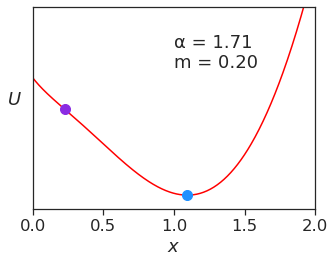

In [101]:
### figure 3 2D plots alone, test

# stiff genes
res = 500
m0 = 1.
tau = 1.
n = 1.1

x_c = x_crit(n)
a_c = alpha_crit(n, tau)
m_c = m_crit_over_m0(n, tau)

params = {}

params['x_c'] = x_c; params['a_c'] = a_c; params['type'] = 'stiff'; params['m0'] = m0; 
params['tau'] = tau; params['n'] = n
m_c = scipy.optimize.fsolve(m_crit_general, 0.5, args=(params), xtol=1e-10)[0] / params['m0']
# choose_mc_ind = np.where(np.abs(m_space - choose_mc) == np.amin(np.abs(m_space-choose_mc)))[0]

params['m_c'] = m_c

x_space = np.linspace(0, 2., res)
a_space = np.linspace(0.2, 2., res)
ac_ind = np.where(np.abs(a_space - a_c) == np.amin(np.abs(a_space-a_c)))[0]
print('ac %f' % a_c)
print('mc %f' % m_c)
print('xc %f' % x_c)
choose_m = 0.2
choose_a = 1.71
chooseA_ind = np.where(np.abs(a_space - choose_a) == np.amin(np.abs(a_space-choose_a)))[0]

U_data = np.zeros((len(x_space), len(a_space)))

for ai, aa in enumerate(a_space):
    for xi, xx in enumerate(x_space):
        U_data[xi, ai] = U(f_m, choose_m, xx, aa, params)

print(np.shape(np.abs(np.diff(U_data, axis=0))))

m0coords = []; m1coords = []; m2coords = []
for ai, aa in enumerate(a_space):
    xargs = find_peaks(-np.abs(np.diff(U_data[:,ai])))[0]
    if aa > a_c:
        x_mins = x_space[xargs]
        if len(x_mins) > 1:
            m1coords.append([np.amin(x_mins), aa, U_data[np.amin(xargs), ai]])
            m2coords.append([np.amax(x_mins),aa, U_data[np.amax(xargs), ai]])
        else:
            if np.abs(np.amin(x_mins) - m1coords[-1][0]) < np.abs(np.amin(x_mins) - m2coords[-1][0]):
                m1coords.append([np.amin(x_mins), aa, U_data[np.amin(xargs), ai]])
            else:
                m2coords.append([np.amax(x_mins),aa, U_data[np.amax(xargs), ai]])
    else:
        x_mins = x_space[xargs]
        m0coords.append([np.amin(x_mins),aa, U_data[np.amin(xargs), ai]])

m0coords = np.array(m0coords); m1coords = np.array(m1coords);m2coords = np.array(m2coords)

fig2, ax2 = plt.subplots(1,1, figsize=(5, 4))

if choose_a < a_c:
    ax2.plot(x_space, U_data[:,chooseA_ind], color=mcolors['red'])
    ax2.scatter(m0coords[chooseA_ind,0], m0coords[chooseA_ind,2], s=100, color=mcolors['black'], zorder=10)
else:
# m1 is purple
# m2 is blue
    ax2.plot(x_space, U_data[:,chooseA_ind], color=mcolors['red'])
    ax2.scatter(m1coords[int(chooseA_ind-len(m0coords)),0], m1coords[int(chooseA_ind-len(m0coords)),2], s=100, color=mcolors['blueviolet'], zorder=10)
    ax2.scatter(m2coords[int(chooseA_ind-len(m0coords)),0], m2coords[int(chooseA_ind-len(m0coords)),2], s=100, color=mcolors['dodgerblue'], zorder=10)


ax2.set_ylabel('$U$', rotation=0, labelpad=18)
ax2.set_xlabel('$x$')
ax2.yaxis.set_ticks([])
ax2.set_xlim([0.,np.amax(x_space)])
ax2.set_ylim([ax2.get_ylim()[0]*1.02, 0.07])

# ax2.text(np.diff(ax2.get_xlim())/2, ax2.get_ylim()[0]*0.2, '\u03b1 = %.2f'%(choose_a))
# ax2.text(np.diff(ax2.get_xlim())/2, ax2.get_ylim()[0]*0.35, 'm = %.2f'%(choose_m))

ax2.text(0.5, 0.8, '\u03b1 = %.2f'%(choose_a), transform=ax2.transAxes)
ax2.text(0.5, 0.7, 'm = %.2f'%(choose_m), transform=ax2.transAxes)

fig2.tight_layout()

saveall = False
if saveall:
#     direc = os.getcwd() + '/figures/figure2/'        
    direc = os.getcwd() + '/powerpoints/ppt_figs/'
    fname = direc + '2D_r3_3.png'
    
    fig2.savefig(fname, format='png', dpi=600)

a_c = 1.190551, x_c = 0.793701, m_c = 0.505590


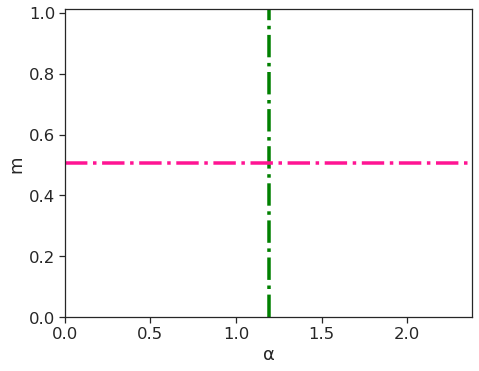

In [108]:
### figure 3 background
tau = 1.; tau_F = tau * 15; tau_SG = tau * 180; tau_SR = tau_SG * 2

m0 = 1.
x0 = 0.2
a0 = 0.2
a_max = 100
n = 3

x_c = x_crit(n)
a_c = alpha_crit(n, tau)
m_c = m_crit_over_m0(n, tau)

print('a_c = %f, x_c = %f, m_c = %f' % (a_c, x_c, m_c))

params = {}
params['x_c'] = x_c; params['a_c'] = a_c; params['m_c'] = m_c
params['tau'] = tau; params['tau_F'] = tau_F; params['tau_SG'] = tau_SG; params['tau_SR'] = tau_SR
params['a_max'] = a_max
params['a0'] = a0; params['m0'] = m0
params['n'] = n
params['x0'] = x0


fig = plot_blank_PD(params)
saveall=False
if saveall:
    direc = os.getcwd() + '/figures/figure2/'

    fname1 = direc + "blank_PD_v3.png"
    print(fname1)
    fig.savefig(fname1, format='png', dpi=600)

In [1]:
## SI figure analogous plot to above but over m axis...
# stiff genes
res = 300
m0 = 1.
tau = 1.
n = 3

choose_a = 1.195

# choose_a = 1.3
x_c = x_crit(n)
a_c = alpha_crit(n, tau)

params['x_c'] = x_c; params['a_c'] = a_c; params['type'] = 'stiff'; params['m0'] = m0; params['tau'] = tau; params['n'] = n
m_c = scipy.optimize.fsolve(m_crit_general, 0.5, args=(params), xtol=1e-10)[0] / params['m0']

# choose_a = a_c+ 0.001

x_space = np.linspace(0, 1.8, res)
m_space = np.linspace(0.01, 1., res)

mc_ind = np.where(np.abs(m_space - m_c) == np.amin(np.abs(m_space-m_c)))[0]

params['a_c'] = choose_a

choose_mc = scipy.optimize.fsolve(m_crit_general, 0.5, args=(params), xtol=1e-10)[0] / params['m0']
choose_mc_ind = np.where(np.abs(m_space - choose_mc) == np.amin(np.abs(m_space-choose_mc)))[0]

U_data = np.zeros((len(x_space), len(m_space)))
print(U)
for mi, mm in enumerate(m_space):
    for xi, xx in enumerate(x_space):
        
        x_stiff = 1-np.exp(-mm/m0)
        U_data[xi, mi] = U(x_stiff, xx, choose_a, tau, n)

m0coords = []
m1coords = []
m2coords = []
for mi, mm in enumerate(m_space):
    xargs = argrelextrema(np.abs(np.diff(U_data[:,mi])), np.less)[0]
    x_mins = x_space[xargs]
    if choose_a >= a_c:
        m1coords.append([np.amin(x_mins), mm, U_data[np.amin(xargs), mi]])
        m2coords.append([np.amax(x_mins), mm, U_data[np.amax(xargs), mi]])
    elif choose_a < a_c:
#         print(len(x_mins))
        m0coords.append([np.amin(x_mins), mm, U_data[np.amin(xargs), mi]])
    else:
        continue

m0coords = np.array(m0coords)
m1coords = np.array(m1coords)
m2coords = np.array(m2coords)
# print(m1coords.shape); print(m2coords.shape)

# print(np.shape(np.abs(np.diff(U_data, axis=0))))
        
fig = go.Figure(data=[go.Surface(z=U_data.T, x=x_space, y=m_space, colorscale='blackbody',
                                cmin=np.amin(U_data)*0.9, cmax=np.amax(U_data)/6
                                )],
                     layout = go.Layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')
               )

fig.update_traces(contours_z=dict(show=True, usecolormap=False,
                                  project_z=True, start=np.amin(U_data), 
                                  end=np.amax(U_data), color='black', size=0.02))

if len(m1coords) > 0:
    fig.add_scatter3d(x=m1coords[:,0], y=m1coords[:,1], z=m1coords[:,2]+0.01, showlegend=False,
                      marker=dict(size=4, color='blueviolet'), line=dict(color='blueviolet', width=8))
if len(m2coords) > 0:
    fig.add_scatter3d(x=m2coords[:,0], y=m2coords[:,1], z=m2coords[:,2]+0.01, showlegend=False,
                      marker=dict(size=4, color='dodgerblue'), line=dict(color='dodgerblue', width=8))
if len(m0coords) > 0:
    fig.add_scatter3d(x=m0coords[:,0], y=m0coords[:,1], z=m0coords[:,2]+0.01, showlegend=False,
                      marker=dict(size=4, color='black'), line=dict(color='black', width=8))


fig.add_scatter3d(x=x_space, y=np.ones(res)*choose_mc, z=U_data[:,choose_mc_ind].squeeze()+0.01, #np.zeros(res),
                  mode='lines', showlegend=False, line=dict(color='black', width=8))

direc = os.getcwd() + '/figures/figure2/'
if choose_a > a_c:
    fname1 = direc + "memory_eng_surface_overAC.png"
    titlename = 'Landscape a > a_c'
elif choose_a < a_c:
    fname1 = direc + "memory_eng_surface_underAC.png"
    titlename = 'Landscape a < a_c'
elif choose_a == a_c:
    fname1 = direc + "memory_eng_surface_atAC.png"
    titlename = 'Landscape a = a_c'

fig.update_layout(title=titlename, autosize=True, scene=dict(
                    xaxis = dict(
                        title='<b>x</b>',titlefont=dict(family='Cambria', size=22), autorange="reversed"),
                    yaxis = dict(
                        title='<b>m</b>',titlefont=dict(family='Cambria', size=22)),
                    zaxis = dict(
                        title='U', range=[np.amin(U_data)*0.9, np.amax(U_data)/6],  showticklabels=False, titlefont=dict(family='Cambria', size=24))),
                  width=650, height=650,
                  margin=dict(l=50, r=50, b=50, t=50),
                  font=dict(family='Cambria', size=16, color='#7f7f7f'),
                  
                  scene_camera = dict(up = dict(x=0,y=0,z=1), 
                                      center = dict(x=0, y=0, z=0.), 
                                      eye = dict(x=-0.5, y=2.5, z=1.2))
                  )

ind_below = int(choose_mc_ind - res/10)
ind_above = int(choose_mc_ind + res/10)

fig.add_scatter3d(x=x_space, y=np.ones(res)*m_space[ind_below], z=U_data[:,ind_below].squeeze()+0.01, #np.zeros(res),
                  mode='lines', showlegend=False, line=dict(color='red', width=2))

fig.add_scatter3d(x=x_space, y=np.ones(res)*m_space[ind_above], z=U_data[:,ind_above].squeeze()+0.01, #np.zeros(res),
                  mode='lines', showlegend=False, line=dict(color='red', width=2))

fig2, ax2 = plt.subplots(2,1, figsize=(6,6))

ax2[0].plot(x_space, U_data[:,ind_below], color='r')
ax2[0].scatter(m1coords[ind_below,0], m1coords[ind_below,2], s=100, color=mcolors['blueviolet'], zorder=10)
ax2[0].scatter(m2coords[ind_below,0], m2coords[ind_below,2], s=100, color=mcolors['dodgerblue'], zorder=10)
ax2[1].plot(x_space, U_data[:,ind_above], color='r')
ax2[1].scatter(m1coords[ind_above,0], m1coords[ind_above,2], s=100, color=mcolors['blueviolet'], zorder=10)
ax2[1].scatter(m2coords[ind_above,0], m2coords[ind_above,2], s=100, color=mcolors['dodgerblue'], zorder=10)

ax2[0].set_xlim([0.,1.5])
ax2[1].set_xlim([0.,1.5])

ax2[0].set_ylim([ax2[0].get_ylim()[0]*1.02, 0.07])
ax2[1].set_ylim([ax2[1].get_ylim()[0]*1.02, 0.])

plt.tight_layout()
fig.show()

saveall = False
if saveall: 
    print(fname1)
    fig.write_image(fname1, scale = 2., engine='kaleido')
    
    fname2 = fname1.split('.')[0] + '_secondary.png'
    fig2.savefig(fname2, format='png', dpi=600)

NameError: name 'x_crit' is not defined

a_c = 1.190551, x_c = 0.793701, m_c in absolute = -0.000000


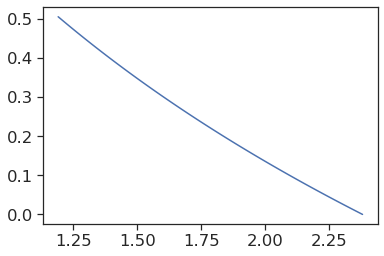

In [6]:
tau = 1.
tau_F = tau * 5
tau_SG = tau * 178
# tau_SR = tau_SG

m0 = 1.
x0 = 0.2
a0 = 0.2
n = 3

x_c = x_crit(n)
a_c = alpha_crit(n, tau)

ac_test = np.linspace(a_c, a_c*2, 100)

params = {}
params['x_c'] = x_c; params['a_c'] = a_c; params['type'] = 'stiff'; params['m0'] = m0
params['tau'] = tau; params['n'] = n
mc_list = []
for ai, aa in enumerate(ac_test):
    params['a_c'] = aa
    m_c = scipy.optimize.fsolve(m_crit_general, 0.5, args=(params), xtol=1e-10)[0] / params['m0']
    mc_list.append(m_c)

params['m_c'] = m_c
print('a_c = %f, x_c = %f, m_c in absolute = %f' % (a_c, x_c, m_c * params['m0']))

plt.plot(ac_test, mc_list)

In [5]:
### **** need to shift functions for alpha / regions for alpha depending on stiffness **** ###
### figure 3.5 partially filled phase diagram, no trajectory.
#### integrate profile depends on energy
## setting time units to hours

tau = 1.
tau_F = tau * 15
tau_SG = tau * 150
tau_SR = tau_SG

m0 = 2.
x0 = 0.2
a0 = 0.2
a_max = 100
n = 3

x_c = x_crit(n)
a_c = alpha_crit(n, tau)


params = {}
params['x_c'] = x_c; params['a_c'] = a_c;
params['tau'] = tau; params['tau_F'] = tau_F; params['tau_SG'] = tau_SG; params['tau_SR'] = tau_SR
params['a_max'] = a_max
params['a0'] = a0; params['m0'] = m0
params['n'] = n
params['x0'] = x0
params['type'] = 'stiff'

params['tau_R0'] = tau_SG * 2
params['TV0'] = .08

a_space, mtst = calc_PD(params)

params['a1max'] = a_space[mtst[:,0] == np.amin(mtst[:,0])]

m_c = scipy.optimize.fsolve(m_crit_general, 0.5, args=(params), xtol=1e-10)[0] / params['m0']
params['m_c'] = m_c

print('a_c = %f, x_c = %f, m_c = %f' % (a_c, x_c, m_c))

# 480 hours = 20 days
# time in hours | # stiffness
ins = np.array(
    [
        [250, 0.8],
        [150, 1.6],
#         [250, 0.6],
#         [150, 0.3],    
    ]
        )

m_profile = build_mprof(ins, 1.)

print(np.sum(ins[:,0]))
print(len(m_profile))

# hours
t_space = np.linspace(0, np.sum(ins[:,0]), len(m_profile))
print('dt = %f' % (t_space[1]-t_space[0]))

# x_prof, alpha_prof, params, active_region, deltaVlist = integrate_profile_Edependent(m_profile, t_space, params)
# priming_times, memory_times, mech_ratio = summary_stats(alpha_prof, x_prof, m_profile, t_space, params)
# params, fig, fig2 = plot_profile(t_space, m_profile, x_prof, alpha_prof, active_region, params)
fig, ax = plt.subplots(1,1,figsize=(9, 8))
ax = subplot_PD(ax, params, 
    [mcolors['darkorange'], mcolors['red'], mcolors['navy'], mcolors['navy'], mcolors['springgreen'], mcolors['springgreen']])


# plt.plot(np.arange(len(deltaVlist)), deltaVlist)
saveall = False
if saveall:
    direc = os.getcwd() + '/figures/figure3_timetraj/'

    fname1 = direc + "PD_notrajectory_stiff_n3_v3.png"
    print(fname1)
    fig.savefig(fname1, format='png', dpi=600)


TypeError: alpha_crit() missing 1 required positional argument: 'params'

In [ ]:
import sympy

print(sympy.__version__)
sympy.init_printing(use_unicode=True)

n_test = 4
tau = 1.5

a_c = alpha_crit(n_test, tau)
print('a_c %f' % (a_c))

a_test = 5.5

alpha, x, n = sympy.symbols('alpha x n')
eqn = sympy.Eq(1+x**n, sympy.sqrt(alpha * tau * n * x**(n-1)))

eqn = eqn.subs(n, n_test)
eqn = eqn.subs(alpha, a_test)

sol2 = sympy.solve(eqn, x, force=True)

print(sol2)
print(m1n3(a_test, 3))
print(m2n3(a_test, 3))
# print(sol2.evalf())
# print(list(sol2))

x_space = np.linspace(0,2,5000)

solcands = 1+x_space**n_test - np.sqrt(n_test * a_test * tau * x_space**(n_test-1))
roots = np.array(sorted(x_space[np.argpartition(np.abs(solcands),1)][0:2]))
print(roots)
m_roots = -np.log(1 - roots / tau + a_test * roots**n_test / (1+roots**n_test))
print(m_roots)

plt.plot(x_space, solcands)
plt.plot(plt.xlim(), [0,0])

plt.show()

# sol = sympy.solveset(Eq(x**2-n*x, n))
# print(sol)
# print(sol2.subs(alpha, 1.))
# print(sympy.N(sol))
